In [175]:
import math
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation

In [185]:
length = 6  # length of pendulum
h = 5 # distance between nail and punto di sospensione
theta_0 = math.pi / 4  # initial angle (45 degrees)
alpha = -math.pi / 6 # angle of nail contact in relation to vertical (30 degrees)
num_steps = 1000  # number of simulation steps
num_steps_for_animation = 1000
dt = 0.01  # time step
g = 9.81  # gravity
v0 = 0  # initial velocity

In [177]:
def simulate_pendulum(init_velocity, length_):
    theta = theta_0
    coordinates_ = []

    x = length_ * math.sin(theta)
    y = -length_ * math.cos(theta)
    velocity = init_velocity

    for _ in range(num_steps):
        acceleration = -g/length_ * math.sin(theta)
        velocity += acceleration * dt
        theta += velocity * dt

        x = length_ * math.sin(theta)
        y = -length_ * math.cos(theta)
        coordinates_.append((x, y))

    return coordinates_

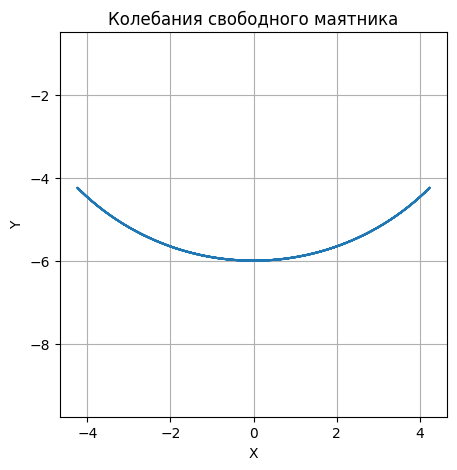

In [178]:
coordinates = simulate_pendulum(v0, length)
x_values, y_values = zip(*coordinates)


plt.figure(figsize=(5,5))
plt.plot(x_values, y_values)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Колебания свободного маятника')
plt.grid(True)
plt.axis('equal')
plt.show()

In [179]:
# fig, ax = plt.subplots()
# plt.axis('equal')
# ax.set_xlim(-length-5, length+5)
# ax.set_ylim(-length-5, length+5)
# line, = ax.plot([], [], 'o-', lw=2)

# def init():
#     line.set_data([], [])
#     return line,

# def animate(i):
#     x = x_values[i]
#     y = y_values[i]
#     line.set_data([0, x], [0, y])
#     return line,

# ani = animation.FuncAnimation(fig, animate, frames=num_steps_for_animation, init_func=init, blit=True)
# HTML(ani.to_jshtml())

In [215]:
def get_period(Y):
    peaks = []
    for i in range(1, len(Y) - 2):
        if Y[i - 1] < Y[i] > Y[i + 1]:
            peaks.append(i)
    return peaks[1] * dt

In [181]:
print("Период свободного колебания: =", get_period(y_values))

Период свободного колебания: = 5.1000000000000005


In [210]:
def trace_nailed_movement(velocity, iterator) -> tuple[list, float]:
    global alpha, length, h
    theta = alpha
    new_length = length - h
    print("New length:", new_length)
    print("Old:", length)
    print("starting velocity:", velocity)
    print("increased velocity:", velocity * length / new_length)
    
    x0 = h * math.sin(alpha)
    y0 = -h * math.cos(alpha)

    print("x0:", x0)
    print("y0:", y0)

    coordinates_ = []

    velocity = velocity * length / new_length

    for iterator in range(num_steps):
        if abs(theta - alpha) <= 0.03 and velocity > 0:
            diminished_velocity = velocity * new_length / length
            return coordinates_, diminished_velocity
        
        acceleration = -g/new_length * math.sin(theta)
        velocity += acceleration * dt
        theta += velocity * dt

        x = x0 + new_length * math.sin(theta)
        y = y0 - new_length * math.cos(theta)
        coordinates_.append((x, y))


def pendulum_with_nail(init_velocity):
    global alpha, length, h
    theta = theta_0
    coordinates_ = []

    x = length * math.sin(theta)
    y = -length * math.cos(theta)

    velocity = init_velocity

    for iterator in range(num_steps):
        if abs(theta - alpha) <= 0.03 and velocity < 0:
            nailed_movement = trace_nailed_movement(velocity, iterator)
            coordinates_.extend(nailed_movement[0])
            velocity = nailed_movement[1]
        else:
            acceleration = -g/length * math.sin(theta)
            velocity += acceleration * dt
            
        theta += velocity * dt

        x = length * math.sin(theta)
        y = -length * math.cos(theta)
        coordinates_.append((x, y))

    return coordinates_

New length: 1
Old: 6
starting velocity: -0.7571398103576594
increased velocity: -4.542838862145956
x0: -2.4999999999999996
y0: -4.330127018922194
New length: 1
Old: 6
starting velocity: -0.7457203723965594
increased velocity: -4.474322234379357
x0: -2.4999999999999996
y0: -4.330127018922194
New length: 1
Old: 6
starting velocity: -0.7353991309289211
increased velocity: -4.412394785573526
x0: -2.4999999999999996
y0: -4.330127018922194


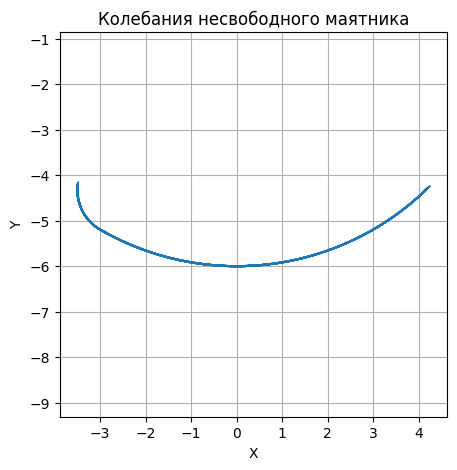

In [211]:
coordinates_with_nail = pendulum_with_nail(v0)
x_values_nail, y_values_nail = zip(*coordinates_with_nail)


plt.figure(figsize=(5,5))
plt.plot(x_values_nail, y_values_nail)
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Колебания несвободного маятника')
plt.grid(True)
plt.axis('equal')
plt.show()

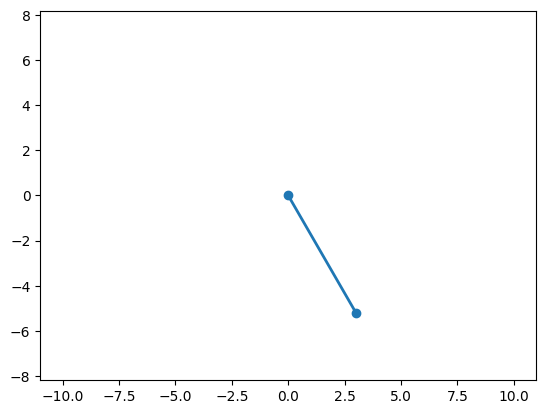

In [213]:
fig, ax = plt.subplots()
plt.axis('equal')
ax.set_xlim(-length-5, length+5)
ax.set_ylim(-length-5, length+5)
line, = ax.plot([], [], 'o-', lw=2)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    x = x_values_nail[i]
    y = y_values_nail[i]
    line.set_data([0, x], [0, y])
    return line,

ani = animation.FuncAnimation(fig, animate, frames=num_steps_for_animation, init_func=init, blit=True)
HTML(ani.to_jshtml())

In [216]:
print("Период свободного колебания: =", get_period(y_values_nail))

Период свободного колебания: = 4.65
